<a href="https://colab.research.google.com/github/joaosoutto95/realstate_insights/blob/main/real_state_insights.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# **Summary:**
1.   Objective
2.   Business premises
3.   Planning the solution
4.   Main insight hypothesis
5.   Financial results
6.   Conclusion
7.   Solution improvement




# Objective:


The objective of the project is to discover business insights based on public market data, ie actionable findings for a company in view of market offerings.
In this case, the sector evaluated is real estate, in which the company seeks to structure a strategy to define good deals. It is expected as a final product, **a report with purchase and sale recommendations, indications of the ideal moment for this sale and the recommended profit margin that is established.**

# Business Premises:



*   The dataset is based on historical data of properties already sold, so the planned business strategy will be evaluated under a condition in which properties of the same attribute are repeated;
*   The business plan of the company is to **buy cheap, reform and sell high standard properties** ;
*   Taxes, inflation and other business expenses will **not be considered** in the profit margin calculation of this analysis;
*   Reform cost will be simplified as a **deduction of 50% on the profit margin**;
*   Comparison of properties should be always **under the same zipcode**. After grouping by the zipcode there would be a data exploratory analisis to see correlation between the attributes.
*   Due to a diversity of types within the properties offered, a customer profile was chosen: **properties with a value between 1,000,000.00 dolars and 1,500,000.00 dolars**. This is justified by the high standard deviation in the price distribution, allowing great profit margins in high standard properties compared to low.


Final Report:
- with purchase and maximum sale price recommendations
- indications of the ideal moment for this sale and the recommended profit margin that is established

# Planning the solution:

##*Importing data and defining functions used*

In [ ]:
!pip install geopandas
!pip install plotly-express
!pip install jupyter-dash
!pip install dash-bootstrap-components
# !pip install 'streamlit-folium==0.3.0'

In [3]:
# Imports:
    # Data manipulation and extraction:
import pandas as pd
import numpy as np
import geopandas
import math
from urllib.request import urlopen
import json
# from IPython.core.display import HTML
from sklearn.linear_model import LinearRegression

    # Data visualization
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from matplotlib import gridspec
import ipywidgets as widgets
from ipywidgets import fixed

    # Dashboard libs:
from jupyter_dash import JupyterDash
from dash import dcc
from dash import html
from dash.dependencies import Input, Output
import dash_bootstrap_components as dbc

# -----------------------------------------------------------------------------------------------

# Defined functions:

def get_geofile( url ):
    geofile = geopandas.read_file( url )
    return geofile

    # Function to read data:
def get_data(path):
    data = pd.read_csv(path)
    return data

    # Function to load data in an interactive map:
def interactive_map(df_map, attr):
    map_interactive = px.scatter_mapbox(
        df_map,
        lat='lat',
        lon='long',
        color=attr,
        size='price',
        color_continuous_scale=px.colors.sequential.Rainbow,
        size_max=15,
        zoom=10,
        hover_name='id'
    )
    map_interactive.update_layout(mapbox_style='open-street-map')
    map_interactive.update_layout(height=400, width=500, margin={'r': 0, 't': 0, 'l': 0, 'b': 0})
    # return c.plotly_chart(map_interactive)
    return map_interactive.show()

# Function responsable of cleaning data
def clean_df(data):
    # Drop useless columns:
    data = data.drop(columns=['sqft_living15', 'sqft_lot15'])

    # Date to datetime64 in YYYY-MM-DD format:
    data['date'] = data['date'].str.slice(stop=8)
    data['date'] = pd.to_datetime(data['date'], format='%Y%m%d')

    # Converting sqft to m² in all columns except sqft_living because that will be done after classification with benchmark:
    data[['sqft_lot', 'sqft_above', 'sqft_basement']].apply(lambda x: x * 0.092903)

    # Classification of N° BEDROOMS, PRICE, WATERFRONT and SQFT_LIVING through benchmark:
    # Dormitory types definition:
    data['dormitory_type'] = data['bedrooms'].apply(lambda x: 'studio' 
                                                    if (x == 0) | (x == 1) 
                                                    else ('apartment' 
                                                          if x == 2 
                                                          else 'house'))

    # Standard definition:
    data['standard'] = pd.cut(data['price'], [0, 540000, 10000000], labels=['Low', 'High'])

    # Water front definition:
    data['is_waterfront'] = data['waterfront'].apply(lambda x: 'yes' 
                                                     if (x == 1)
                                                     else 'no')

    # Size type definition:
    data['size_type'] = pd.cut(data['sqft_living'], [0, 1427, 1910, 2550, 50000],
                            labels=['Size 0', 'Size 1', 'Size 2', 'Size 3'])
    data['sqft_living'].apply(lambda x: x * 0.092903)

    # Creating a year, week and day column:
    data['date_yr'] = data['date'].dt.year
    data['date_ywk'] = data['date'].dt.strftime('Week n° %U')
    data['date_day'] = data['date'].dt.strftime('%d-%m-%Y')

    return data

# Calculates the distance between the city center and the middle of a received zipcode
def distance_city_center(zipcode):
    dist = math.sqrt((float(df_zip[df_zip['zipcode']==98039]['lat']) - float(df_zip[df_zip['zipcode']==zipcode]['lat']))**2 +
              (float(df_zip[df_zip['zipcode']==98039]['long']) - float(df_zip[df_zip['zipcode']==zipcode]['long']))**2)
    if dist <= 0.21447272359304828:
      return 'City Area'
    else:
      return 'Country Side'

# Plot cloropleth mapbox receiving the df_zip and an attribute evaluated:
def attr_map(zip_df, attr):
    fig1 = px.choropleth_mapbox(zip_df, geojson=zip_codes, locations='zipcode',
                              featureidkey='properties.ZIP', color=attr,
                              color_continuous_scale="Viridis",
                              mapbox_style="carto-positron",
                              range_color=(zip_df[attr].quantile(q=.25), zip_df[attr].quantile(q=.9)),
                              zoom=5, center = {"lat": 47.561, "lon": -122.158},
                              opacity=0.5,
                              labels={attr:(attr).upper(), 'zipcode':'ZIPCODE'}
                              )
    fig1.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    return fig1

# Correlation matrix of attribute:
def attr_corr(df):
    hmap = sns.heatmap(df.corr(), vmin= -1, vmax= 1, cmap="Spectral", annot = True)
    return hmap

def attr_ln_reg(data, attr, zip):
    lm = LinearRegression()
    x = np.array(data.loc[data['zipcode']==zip][attr]).reshape(-1, 1)
    y = data.loc[data['zipcode']==zip]['price']
    lm.fit(x,y)
    slp =  lm.coef_
    intcpt = lm.intercept_
    return slp, intcpt
# -----------------------------------------------------------------------------------------------

# Loading data:
    # Info on properties: 
path = '/content/drive/MyDrive/Colab Notebooks/kc_house_data.csv'
df_raw = get_data(path)

#     # Info from geofile:
# url = 'https://opendata.arcgis.com/datasets/83fc2e72903343aabff6de8cb445b81c_2.geojson'
# geofile = get_geofile( url )

    # Info from geofile:
with urlopen('https://opendata.arcgis.com/datasets/83fc2e72903343aabff6de8cb445b81c_2.geojson') as response:
    zip_codes = json.load(response)

## *Cleaning and describing data*

In [4]:
# Using the function to clean dataframe:
df = clean_df(df_raw)
print('Column names:', list(df.columns))
df

Column names: ['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'dormitory_type', 'standard', 'is_waterfront', 'size_type', 'date_yr', 'date_ywk', 'date_day']


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,dormitory_type,standard,is_waterfront,size_type,date_yr,date_ywk,date_day
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,house,Low,no,Size 0,2014,Week n° 41,13-10-2014
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,house,Low,no,Size 3,2014,Week n° 49,09-12-2014
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,apartment,Low,no,Size 0,2015,Week n° 08,25-02-2015
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,house,High,no,Size 2,2014,Week n° 49,09-12-2014
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,house,Low,no,Size 1,2015,Week n° 07,18-02-2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,2014-05-21,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,98103,47.6993,-122.346,house,Low,no,Size 1,2014,Week n° 20,21-05-2014
21609,6600060120,2015-02-23,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,98146,47.5107,-122.362,house,Low,no,Size 2,2015,Week n° 08,23-02-2015
21610,1523300141,2014-06-23,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,98144,47.5944,-122.299,apartment,Low,no,Size 0,2014,Week n° 25,23-06-2014
21611,291310100,2015-01-16,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,98027,47.5345,-122.069,house,Low,no,Size 1,2015,Week n° 02,16-01-2015


In [5]:
# Describing df by using .describe():
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,date_yr
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,2014.322954
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,0.467616
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,2014.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,2014.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,2014.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2015.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,2015.000000


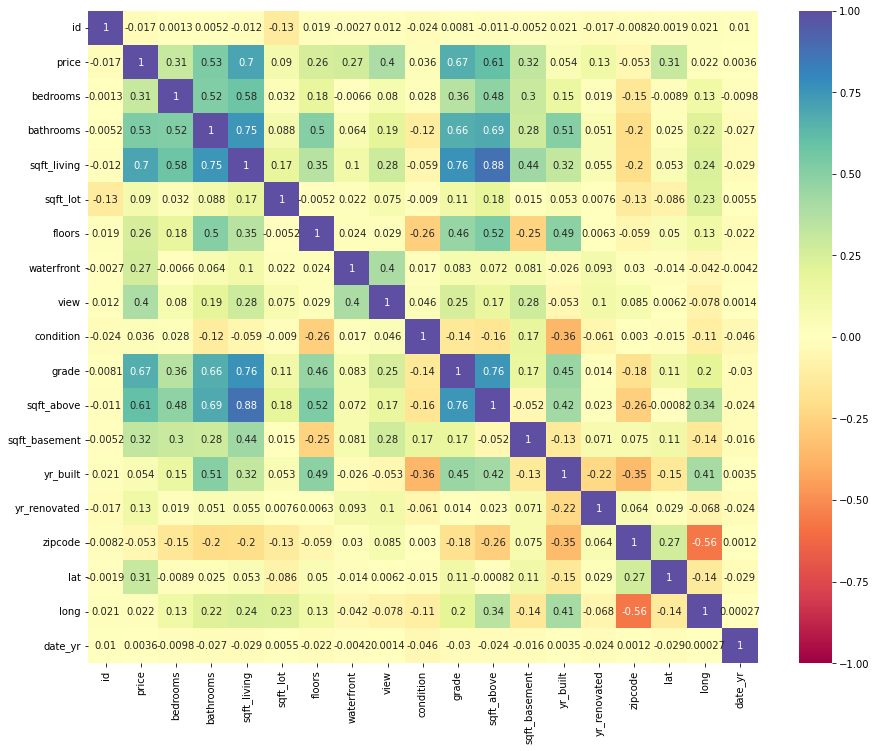

In [6]:
# Testing all the corrilations in dataframe:
plt.figure (figsize = (15,12))
sns.heatmap(df.corr(), vmin= -1, vmax= 1, cmap="Spectral", annot = True)



In [7]:
# Grouping dataset by zipcode, resuming data with averages:
df_zip = df.groupby(by=['zipcode']).mean().reset_index()
df_zip.head()

# Ploting map of dataframe separated in zipcodes to understand the relationship between price and zipcode:
attr_map(df_zip, 'price').show()

## *Defining good business oportunities through intra zipcode correlations*

In [9]:
# FINDING BEST ATTRIBUTE CORRELATION FOR EACH ZIPCODE:
L= []
for i in list(df['zipcode'].unique()):
    L.append(list(df[df['zipcode']==i].corr()['price']))

best_fit_df = pd.DataFrame(L, columns=df.corr().columns, index=df['zipcode'].unique())
best_fit_df.drop(['id','price','zipcode'], axis=1, inplace=True)
best_fit_df['best_fit_value'] = best_fit_df.abs().max(axis=1)
best_fit_df['best_fit_key'] = best_fit_df.abs().idxmax(axis=1)

best_fit_df.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,date_yr,best_fit_value,best_fit_key
98178,0.304252,0.489633,0.596229,0.125103,0.219527,0.714336,0.721346,0.017763,0.581447,0.517557,0.348092,0.236905,0.063326,0.350236,0.225426,0.043580,0.721346,view
98125,0.306702,0.423022,0.630126,0.389866,0.048225,0.685789,0.673190,0.106799,0.470018,0.584263,0.307852,-0.052112,0.428805,-0.146988,0.391544,0.017597,0.685789,waterfront
98028,0.389054,0.513492,0.747733,0.103468,0.246272,0.453932,0.465392,0.040902,0.690120,0.599109,0.296337,0.300818,-0.034799,-0.120000,-0.038768,0.070604,0.747733,sqft_living
98136,0.483318,0.494383,0.759038,0.584028,0.118786,0.479195,0.626322,0.193000,0.656411,0.705378,0.401468,0.049632,0.200887,-0.133367,-0.299831,0.006717,0.759038,sqft_living
98074,0.355984,0.592828,0.720072,0.184586,0.305448,0.575107,0.418504,-0.088585,0.604182,0.622752,0.197759,0.344910,0.001609,-0.148509,-0.066800,0.013229,0.720072,sqft_living


For example, the correlation matrix of zipcode 98039 is:
AxesSubplot(0.125,0.125;0.62x0.755)
Based on the heatmap above, the main correlation between the pric and a attribute for zipcode 98039 region is with sqft_living . The graph bellow shows the distribution of the properties around the regression


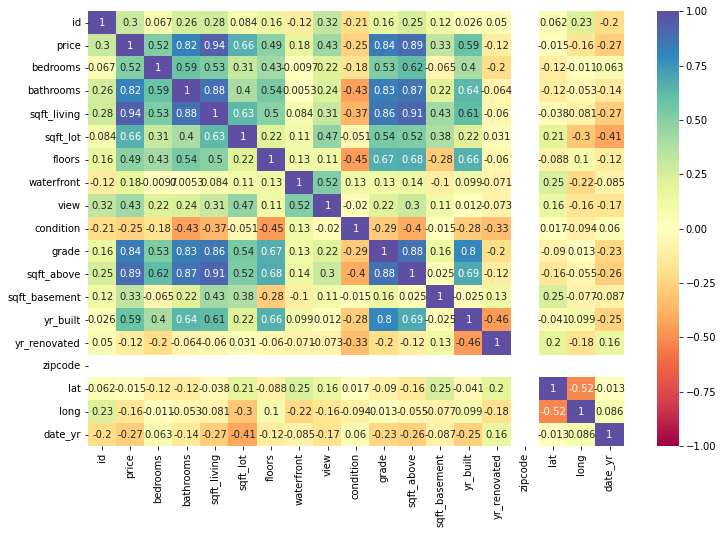

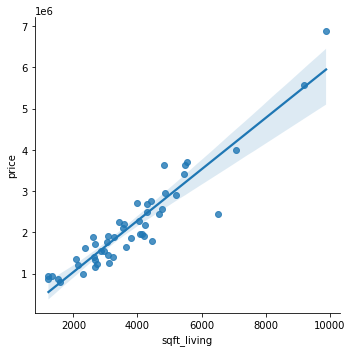

In [10]:
    # Example:
print('For example, the correlation matrix of zipcode 98039 is:')
plt.figure (figsize = (12,8))
print(sns.heatmap(df[df['zipcode']==98039].corr(), vmin= -1, vmax= 1, cmap="Spectral", annot = True))
        
        # Example Results:
print('Based on the heatmap above, the main correlation between the pric and a attribute for zipcode 98039 region is with',
      best_fit_df[best_fit_df.index==98039]['best_fit_key'].item(),
       '. The graph bellow shows the distribution of the properties around the regression')

        # Example Graph:
zip = 98039
attr = best_fit_df.loc[best_fit_df.index == zip]['best_fit_key'].item()
sns.lmplot(x=attr, y="price", data=df.loc[df['zipcode']==zip])

In [11]:
# Calculating, based on linear regression values expected for each property 
#     of dataset, business decision, profit margin and profit value:

df['business_decision'] = None
df['profit_margin'] = None
df['profit_value'] = None
for i in range(0,len(df)):
    prop_price = df['price'].iloc[i]
    zip = df['zipcode'].iloc[i]
    best_fit_attr = best_fit_df.loc[best_fit_df.index == zip]['best_fit_key']
    slope, intercept = attr_ln_reg(df, best_fit_attr, zip)
    slope = slope[0]
    y_predict = df[best_fit_attr].iloc[i].item()*slope + intercept
    resd_mean_error = (df[df['zipcode']==zip]['price'] - y_predict).abs().mean()

    if prop_price < y_predict:
        df['business_decision'][i] = 'Buy'
        df['profit_margin'][i] = ((y_predict) - (prop_price) + (resd_mean_error))/(prop_price)
        df['profit_value'][i] = (df['profit_margin'][i])*(df['price'][i])
    else:
        df['business_decision'][i] = 'Dont buy'
        df['profit_margin'][i] = 0
        df['profit_value'][i] = 0



A saída de streaming foi truncada nas últimas 5000 linhas.
See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://p

## Saving new df with buying recomendations and profit

In [12]:
# # RUNNING LAST CODE TOOK 3 MIN, BETTER SAVING THE RESULTS:
# path_save = '/content/drive/MyDrive/Colab Notebooks/data_analised.csv'
# df.to_csv(path_save)

In [14]:
# IMPORTING IN CASE NEEDS TO RUN CODES AGAIN:
path = '/content/drive/MyDrive/Colab Notebooks/data_analised.csv'
df = get_data(path)

## Setting the time to buy and sell

In [15]:
# Plotting the price evolution:
df_plot = df.groupby(by=['date_ywk']).mean().reset_index()
fig2 = px.line(df_plot, x="date_ywk", y="price", title='Price evolution 2014~2015')
fig2.show()

## Limiting business oportunities to 1M ~ 1.5M properties

In [ ]:
# JUSTIFYING THE CHOICE OF >1M PROPERTIES DUE DO BIGGER PROFIT MARGINS BASED ON STD DEV:

for item in list(best_fit_df['best_fit_key'].unique()):
    fig3 = px.box(df, x=item, y="price")
    fig3.show()

# AS CAN BE SEEN THERE IS A STRONG CORR BETWEEN SELECTED ATTRIBUTES AND PRICE.
# FURTHERMORE GRAPHS BELOW SHOW A GROWING STANDARD DEVIATION IN RELATION TO PRICE:

In [21]:
# FILTERING PROPERTIES BY THE RIGHT TIME OF PURCHASE:
df['date'] = pd.to_datetime(df['date'])
df_buy_cond1 = df.loc[(df['business_decision']=='Buy')&
                (df['date'].dt.strftime('%B').isin(['January',
                                                    'February',
                                                    'October',
                                                    'November',
                                                    'December']))].sort_values(by=['profit_value'], ascending = False)
print('TOTAL = ', df_buy_cond1['price'].count())
fig_1 = px.scatter(df_buy_cond1, x='profit_value', y='price', title='Profit value vs Price of property (All properties):', trendline="ols")
fig_1.show()


TOTAL =  3932


In [22]:
# BUYING PROPERTIES OFFERED IN THE BUSINESS PLAN RANGE OF PRICES(1M ~ 1.5M):
df_buy_cond2 = df_buy_cond1[(df_buy_cond1['price']>1000000)&
                            (df_buy_cond1['price']<1500000)]
print('TOTAL = ', df_buy_cond2['price'].count())
fig_2 = px.scatter(df_buy_cond2, x='profit_value', y='price', title='Profit value vs Price of property:', trendline="ols")
fig_2.show()


TOTAL =  85


In [32]:
# MAP TO VISUALIZE TOP 20 PROPERTIES RECOMENDED BY PROFIT VALUE

df_buy_cond3 = df_buy_cond2[(df_buy_cond2['profit_value']>1000000)].sort_values(by=['profit_margin'], ascending=False).reset_index()
df_buy_cond3.drop(columns=['index',	'Unnamed: 0'], inplace=True)

df_int_map = df_buy_cond3[['id','price','profit_margin','profit_value','lat','long']]
interactive_map(df_int_map, 'profit_value')
df_int_map.sort_values(by=['profit_value'], ascending=True).reset_index()

,index,id,price,profit_margin,profit_value,lat,long
0,19,8127700390,1280000.0,0.823367,1.053910e+06,47.6427,-122.397
1,21,1118001360,1475000.0,0.716376,1.056655e+06,47.6324,-122.289
2,11,825059270,1095000.0,0.965754,1.057501e+06,47.6627,-122.188
3,20,3025300225,1450000.0,0.741157,1.074677e+06,47.6232,-122.235
4,17,2397100975,1313000.0,0.866545,1.137773e+06,47.6366,-122.362
5,7,5015000346,1047000.0,1.118522,1.171093e+06,47.6280,-122.299
6,18,9831200520,1443920.0,0.831829,1.201095e+06,47.6282,-122.322
7,9,2581900165,1130000.0,1.072145,1.211524e+06,47.5396,-122.214
8,13,4221900305,1312000.0,0.926235,1.215221e+06,47.6664,-122.276
9,16,7933250050,1419000.0,0.877758,1.245539e+06,47.6349,-122.204


# Financial results for the business:

In [34]:
print('The sum of all the profit gainedby buying the selected 20 properties, '
      'considering the 50% cost with remodeling, will be: ', "U${:,.2f}".format(df_int_map['profit_value'].sum()/2))
print('In case of buying all the properties at once, the amount needed will bem: ', "U${:,.2f}".format(df_int_map['price'].sum()))

The sum of all the profit gainedby buying the selected 20 properties, considering the 50% cost with remodeling, will be:  U$14,031,244.99
In case of buying all the properties at once, the amount needed will bem:  U$27,638,920.00


# Conclusion:

In a market as heterogeneous as real estate, one should always seek to evaluate correlations in order to group the different products as a way to obtain greater predictability in their pricing. Thus, it is possible to determine if a property is below its market cost or above, and still in this line of reasoning, determine how much return can be expected if it is bought, renovated and sold.

# Solution Improvments



*   Without using machine learning clusterization, should look for other metrics for relative error that will define the profit margin;
*   Search for taxes, usual costs and inflation to make a real estimate on the profit margin;
*   Implement clusterization algorithm to decide the diferent type of properties.



# Main insight hypothesis

In [23]:
# FIRST HYPOTHESIS - Apartments and studios are, in average, 20 years newer than the houses at sale.

## BAR PLOT


In [24]:
# SECOND HYPOTHESIS - The standard deviation of houses is approximately double that of studios and apartments.

## LINE PLOT PRICES AND STD VS TIME

In [25]:
# THIRD HYPOTHESIS - Mean price of properties built before 1970 are in average half the price of the ones after 1970.

df['bins_yr_built'] = pd.cut(df[df['standard']=='High']['yr_built'],bins=[df['yr_built'].min()-1,1970,df['yr_built'].max()+1]).astype(str)
df_h1 = df.groupby(['bins_yr_built']).mean().reset_index()

fig_h1 = px.bar(df_h1, x='bins_yr_built', y='price')
fig_h1.update_traces(width=.3)
fig_h1.show()

In [26]:
# FOURTH HYPOTHESIS - Prices increase usually by 5% in summer compared to winter.

## LINE PLOT
df_plot_w = pd.concat([df_plot[['date_ywk','price']].iloc[0:8],
                       df_plot[['date_ywk','price']].iloc[49:53]], join="inner").mean()

df_plot_s = df_plot[['date_ywk','price']].iloc[21:33].mean()
df_climate = pd.DataFrame([['Summer', int(df_plot_s)],['Winter', int(df_plot_w) ]], columns=['Season', 'Average Price'])
fig_h4 = px.bar(df_climate, x="Season", y="Average Price", title='Are prices higher on summer than on winter?')
fig_h4.update_traces(width=.3)
fig_h4.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



In [30]:
# FIFTH HYPOTHESIS - The average condition is 0.5 higher in the city compared to peripheral areas.



In [ ]:
app = JupyterDash(__name__, external_stylesheets=[dbc.themes.DARKLY])

app.layout = html.Div([
    
    html.H1("Real State Dashboard"),
        
    dcc.Graph(id="main-graph", 
              figure=attr_map(df_zip, 'price')),

    html.H1("Price Evolution 2014-2015:"),
    
    dcc.Dropdown(id='slct-week',
                 options=list(range(0,52)),
                 multi=False,
                 value = 0,
                 style = {'width':'40%'}),

    dcc.Graph(id="line_plot", figure=fig2)],
    
    style={'width': '49%', 'display': 'inline-block', 'padding': '0 20'}
        
    )

if __name__ == '__main__':
    app.run_server(mode='external',debug=True, port=8051)

